<a href="https://colab.research.google.com/github/otravezsopa/breastcancer/blob/main/BreastCancer_ML_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Breast Cancer**

Breast cancer occurs when breast cells begin to grow out of control. Breast cancer cells typically form a tumor that can often be seen on an x-ray or felt as a mass or lump.

Breast cancer occurs almost exclusively in women, but men can also get it. It is the most common type worldwide, and the number 1 cause of death in women. Approximately 1 in 12 women will develop breast cancer during their lifetime.

The majority of breast cancer cases and deaths from the disease occur in low- and middle-income countries.

Early detection is key in the fight against this disease. Initial tests are based on different types of images of the breast and, eventually, biopsies to determine whether it is a benign or malignant tumor.

The cells obtained from the biopsy can be analyzed for their morphology or expression markers of different proteins, in order to classify the tumor. In addition, there is a growing number of genetic tests to characterize and confront the tumor.

# Package Import

In [1]:
pip  install mlxtend --upgrade --no-deps

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.9 MB/s eta 0:00:00
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.22.0
    Uninstalling mlxtend-0.22.0:
      Successfully uninstalled mlxtend-0.22.0


In [2]:
pip install flatten_json

In [3]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     | 17.8 MB 37.8 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 29.5 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=359549 sha256=92ad775d83a7d8002661d1151a9fe4f186829891a21f8ade99622721f4438dfa
  Stored in directory: /tmp/pip-ephem-wheel-cache-cyh88m8q/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=31c05c93c262d9d5e748c7a3cae1d87e4b9ac2b2b59a03cc4f1751fe15da2cc9
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built ydata-profiling htmlmin


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets, neighbors, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from mlxtend.plotting import plot_decision_regions
import json
from flatten_json import flatten
import missingno as msno
from urllib.request import urlopen
import pandas_profiling
from statistics import mode
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

<ipython-input-4-9eea976c8707>:15: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


# Data Import

**Source:** Genomic Data Commons Data Portal (NIH database)

https://portal.gdc.cancer.gov/projects/TCGA-BRCA


In [5]:
url='https://raw.githubusercontent.com/otravezsopa/breastcancer/main/nationwidechildrens.org_clinical_patient_brca.txt'

df= pd.read_csv(url,delimiter = "\t")


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1099 entries, 0 to 1098
Columns: 112 entries, bcr_patient_uuid to tumor_tissue_site
dtypes: object(112)
memory usage: 961.8+ KB


In [7]:
df.head()

,bcr_patient_uuid,bcr_patient_barcode,form_completion_date,prospective_collection,retrospective_collection,birth_days_to,gender,menopause_status,race,ethnicity,...,icd_o_3_histology,icd_o_3_site,informed_consent_verified,metastatic_tumor_indicator,patient_id,project_code,site_of_primary_tumor_other,stage_other,tissue_source_site,tumor_tissue_site
0,bcr_patient_uuid,bcr_patient_barcode,form_completion_date,tissue_prospective_collection_indicator,tissue_retrospective_collection_indicator,days_to_birth,gender,menopause_status,race,ethnicity,...,icd_o_3_histology,icd_o_3_site,informed_consent_verified,distant_metastasis_present_ind2,patient_id,project_code,tumor_tissue_site_other,stage_other,tissue_source_site,tumor_tissue_site
1,CDE_ID:,CDE_ID:2003301,CDE_ID:,CDE_ID:3088492,CDE_ID:3088528,CDE_ID:3008233,CDE_ID:2200604,CDE_ID:2957270,CDE_ID:2192199,CDE_ID:2192217,...,CDE_ID:3226275,CDE_ID:3226281,CDE_ID:3288361,CDE_ID:2194698,CDE_ID:,CDE_ID:,CDE_ID:2584114,CDE_ID:2007104,CDE_ID:,CDE_ID:3427536
2,6E7D5EC6-A469-467C-B748-237353C23416,TCGA-3C-AAAU,2014-1-13,NO,YES,-20211,FEMALE,Pre (<6 months since LMP AND no prior bilatera...,WHITE,NOT HISPANIC OR LATINO,...,8520/3,C50.9,YES,[Not Available],AAAU,[Not Available],[Not Applicable],[Not Available],3C,Breast
3,55262FCB-1B01-4480-B322-36570430C917,TCGA-3C-AALI,2014-7-28,NO,YES,-18538,FEMALE,Post (prior bilateral ovariectomy OR >12 mo si...,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,...,8500/3,C50.9,YES,[Not Available],AALI,[Not Available],[Not Applicable],[Not Available],3C,Breast
4,427D0648-3F77-4FFC-B52C-89855426D647,TCGA-3C-AALJ,2014-7-28,NO,YES,-22848,FEMALE,Post (prior bilateral ovariectomy OR >12 mo si...,BLACK OR AFRICAN AMERICAN,NOT HISPANIC OR LATINO,...,8500/3,C50.9,YES,[Not Available],AALJ,[Not Available],[Not Applicable],[Not Available],3C,Breast


# Data Wrangling

I delete the first two rows, that repeat heading or code.

In [8]:
df=df.drop(df.index[:2],axis=0)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1097 entries, 2 to 1098
Columns: 112 entries, bcr_patient_uuid to tumor_tissue_site
dtypes: object(112)
memory usage: 960.0+ KB


In [10]:
list(df)

['bcr_patient_uuid',
 'bcr_patient_barcode',
 'form_completion_date',
 'prospective_collection',
 'retrospective_collection',
 'birth_days_to',
 'gender',
 'menopause_status',
 'race',
 'ethnicity',
 'history_other_malignancy',
 'history_neoadjuvant_treatment',
 'tumor_status',
 'vital_status',
 'last_contact_days_to',
 'death_days_to',
 'radiation_treatment_adjuvant',
 'pharmaceutical_tx_adjuvant',
 'histologic_diagnosis_other',
 'initial_pathologic_dx_year',
 'age_at_diagnosis',
 'method_initial_path_dx',
 'method_initial_path_dx_other',
 'surgical_procedure_first',
 'first_surgical_procedure_other',
 'margin_status',
 'surgery_for_positive_margins',
 'surgery_for_positive_margins_other',
 'margin_status_reexcision',
 'axillary_staging_method',
 'axillary_staging_method_other',
 'micromet_detection_by_ihc',
 'lymph_nodes_examined',
 'lymph_nodes_examined_count',
 'lymph_nodes_examined_he_count',
 'lymph_nodes_examined_ihc_count',
 'ajcc_staging_edition',
 'ajcc_tumor_pathologic_pt',


I use data profiling to assess which features to delete.

In [11]:
#Data Profiling
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

I delete features with many '[Not Available]', codes or dates.

In [12]:
#lista de columnas que no aportan información por mayoría 'not available'
NA=['death_days_to','radiation_treatment_adjuvant','pharmaceutical_tx_adjuvant','histologic_diagnosis_other','method_initial_path_dx_other','first_surgical_procedure_other',
'surgery_for_positive_margins','surgery_for_positive_margins_other','margin_status_reexcision','axillary_staging_method_other','lymph_nodes_examined_ihc_count','metastasis_site',
'metastasis_site_other','er_status_ihc_Percent_Positive','er_positivity_scale_used','er_ihc_score','er_positivity_scale_other','er_positivity_method',
'pr_status_ihc_percent_positive','pr_positivity_scale_used','pr_positivity_ihc_intensity_score','pr_positivity_scale_other','pr_positivity_define_method',
'her2_ihc_percent_positive','her2_positivity_scale_other','her2_positivity_method_text','her2_fish_status','her2_copy_number',
'cent17_copy_number','her2_and_cent17_cells_count','her2_cent17_ratio','her2_and_cent17_scale_other','her2_fish_method','new_tumor_event_dx_indicator',
'nte_er_status','nte_er_status_ihc__positive','nte_er_ihc_intensity_score','nte_er_positivity_other_scale','nte_er_positivity_define_method',
'nte_pr_status_by_ihc','nte_pr_status_ihc__positive','nte_pr_ihc_intensity_score','nte_pr_positivity_other_scale','nte_pr_positivity_define_method',
'nte_her2_status','nte_her2_status_ihc__positive','nte_her2_positivity_ihc_score','nte_her2_positivity_other_scale','nte_her2_positivity_method',
'nte_her2_fish_status','nte_her2_signal_number','nte_cent_17_signal_number','her2_cent17_counted_cells_count','nte_cent_17_her2_ratio',
'nte_cent17_her2_other_scale','nte_her2_fish_define_method','clinical_M','clinical_N','clinical_T','clinical_stage','days_to_initial_pathologic_diagnosis',
'days_to_patient_progression_free','days_to_tumor_progression','disease_code','extranodal_involvement','metastatic_tumor_indicator','project_code',
'site_of_primary_tumor_other','stage_other','informed_consent_verified','tumor_tissue_site','her2_ihc_score','tissue_source_site']
#lista de columnas de códigos repetidos o relacionados con fechas
COD=['bcr_patient_uuid','form_completion_date','prospective_collection','retrospective_collection','birth_days_to','last_contact_days_to',
'initial_pathologic_dx_year','ajcc_staging_edition','patient_id']


df=df.drop(columns=NA)
df=df.drop(columns=COD)

I replace instances with '[Not Available]' text for nan and revise dataset.

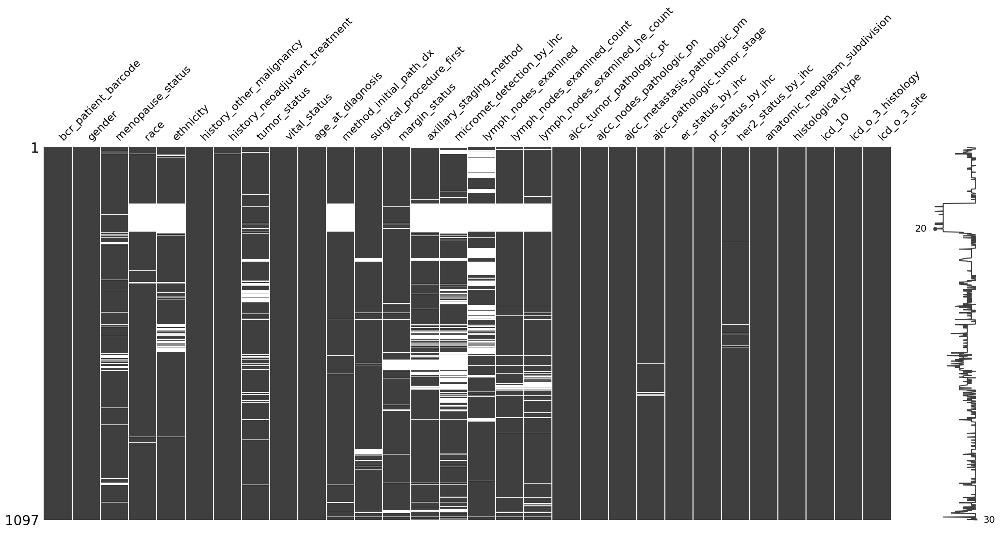

In [13]:
df=df.replace('[Not Available]', np.nan)

msno.matrix(df)
plt.show()

There's a group of instances with nan in several variables. I delete them and recheck dataset.

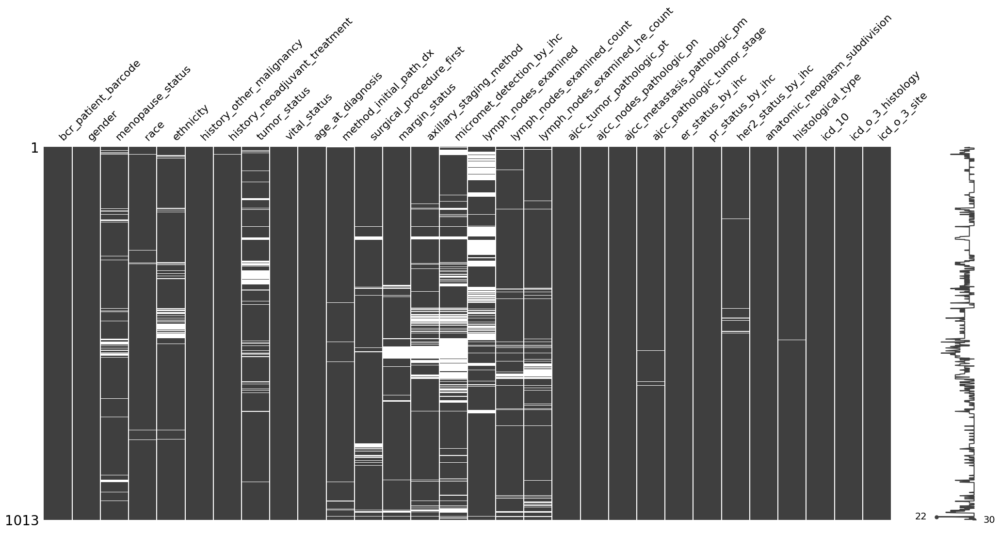

In [14]:
df=df.dropna(subset=['race','ethnicity','method_initial_path_dx','axillary_staging_method'], how='all')

msno.matrix(df)
plt.show()

I delete features with many missing values which I don't want to fill-in for the model.

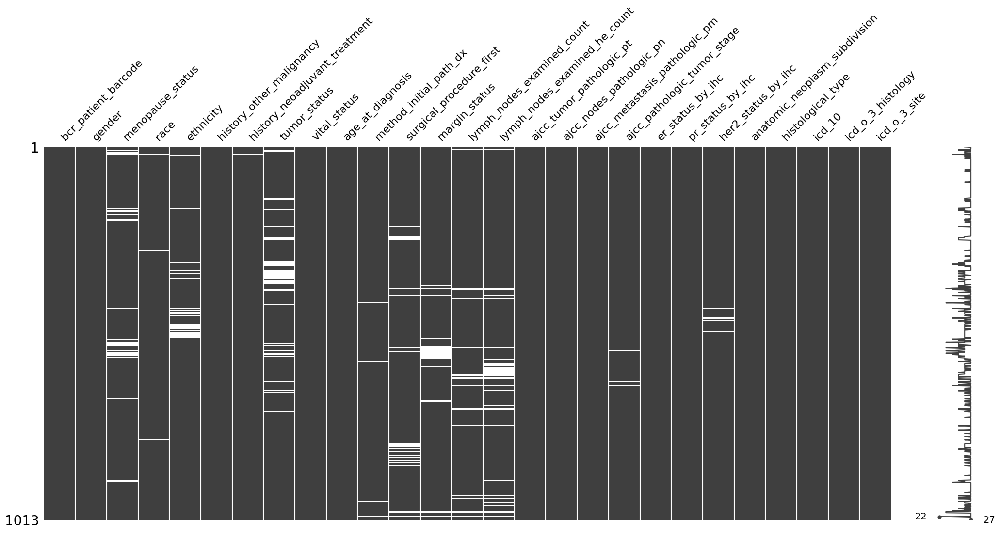

In [15]:
df=df.drop(['lymph_nodes_examined','micromet_detection_by_ihc','axillary_staging_method'],axis=1)

msno.matrix(df)
plt.show()

I fill in missing values in categorical variables with 'Unknown'

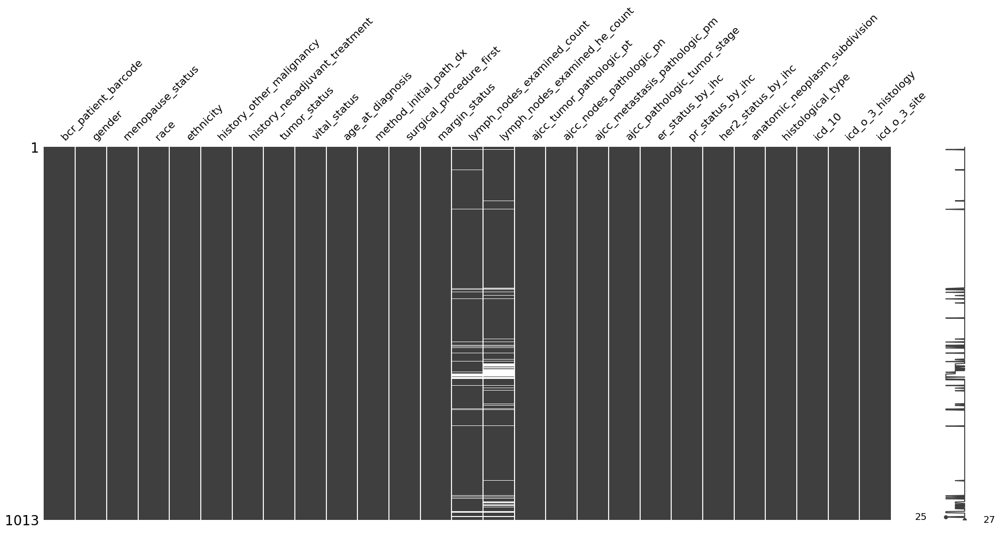

In [16]:
uk=['menopause_status','race','ethnicity','history_neoadjuvant_treatment','tumor_status','method_initial_path_dx','surgical_procedure_first',
    'margin_status','ajcc_pathologic_tumor_stage','her2_status_by_ihc','histological_type']

for i in uk:
  df[i] = df[i].fillna('Unknown')

msno.matrix(df)
plt.show()

I recheck categorical variables: I merge 'Unknown', '[Unknown]' and '[Not Evaluated] and delete discrepancies.

In [17]:
df['menopause_status'].value_counts()

menopause_status
Post (prior bilateral ovariectomy OR >12 mo since LMP with no prior hysterectomy)               633
Pre (<6 months since LMP AND no prior bilateral ovariectomy AND not on estrogen replacement)    219
Unknown                                                                                          65
Peri (6-12 months since last menstrual period)                                                   39
Indeterminate (neither Pre or Postmenopausal)                                                    34
[Unknown]                                                                                        17
[Not Evaluated]                                                                                   6
Name: count, dtype: int64

In [18]:
df=df.replace({'menopause_status':{'[Not Evaluated]':'Unknown','[Unknown]':'Unknown'}})

In [19]:
df['race'].value_counts()

race
WHITE                               757
BLACK OR AFRICAN AMERICAN           183
ASIAN                                61
Unknown                               8
[Not Evaluated]                       3
AMERICAN INDIAN OR ALASKA NATIVE      1
Name: count, dtype: int64

In [20]:
df['race']=df['race'].replace('[Not Evaluated]','Unknown')

In [21]:
df['ethnicity'].value_counts()

ethnicity
NOT HISPANIC OR LATINO    884
Unknown                    79
HISPANIC OR LATINO         39
[Unknown]                   8
[Not Evaluated]             3
Name: count, dtype: int64

In [22]:
df=df.replace({'ethnicity':{'[Not Evaluated]':'Unknown','[Unknown]':'Unknown'}})

In [23]:
df['history_other_malignancy'].value_counts()

history_other_malignancy
No               956
Yes               56
[Discrepancy]      1
Name: count, dtype: int64

In [24]:
df=df.drop(df[df.history_other_malignancy=='[Discrepancy]'].index)

In [25]:
df['history_neoadjuvant_treatment'].value_counts()

history_neoadjuvant_treatment
No               1002
Yes                 8
Unknown             1
[Discrepancy]       1
Name: count, dtype: int64

In [26]:
df=df.drop(df[df.history_neoadjuvant_treatment=='[Discrepancy]'].index)

In [27]:
df['tumor_status'].value_counts()

tumor_status
TUMOR FREE    808
Unknown        99
WITH TUMOR     84
[Unknown]      20
Name: count, dtype: int64

In [28]:
df['tumor_status']=df['tumor_status'].replace('[Unknown]','Unknown')

In [29]:
df['method_initial_path_dx'].value_counts()

method_initial_path_dx
Core needle biopsy                             603
Tumor resection                                164
Fine needle aspiration biopsy                   97
Other method, specify:                          66
Excisional Biopsy                               29
Cytology (e.g. Peritoneal or pleural fluid)     22
Incisional Biopsy                               16
Unknown                                         12
[Discrepancy]                                    2
Name: count, dtype: int64

In [30]:
df['method_initial_path_dx']=df['method_initial_path_dx'].replace('Other method, specify:','Other')

df=df.drop(df[df.method_initial_path_dx=='[Discrepancy]'].index)

In [31]:
df['surgical_procedure_first'].value_counts()

surgical_procedure_first
Modified Radical Mastectomy    321
Lumpectomy                     244
Simple Mastectomy              200
Other                          189
Unknown                         53
[Unknown]                        1
[Discrepancy]                    1
Name: count, dtype: int64

In [32]:
df=df.drop(df[df.surgical_procedure_first=='[Discrepancy]'].index)

df['surgical_procedure_first']=df['surgical_procedure_first'].replace('[Unknown]','Unknown')

In [33]:
df['margin_status'].value_counts()

margin_status
Negative     846
Positive      68
Unknown       60
Close         31
[Unknown]      3
Name: count, dtype: int64

In [34]:
df['margin_status']=df['margin_status'].replace('[Unknown]','Unknown')

In [35]:
df['ajcc_pathologic_tumor_stage'].value_counts()

ajcc_pathologic_tumor_stage
Stage IIA        326
Stage IIB        239
Stage IIIA       145
Stage IA          86
Stage I           86
Stage IIIC        56
Stage IIIB        21
Stage IV          16
Stage X            9
Stage IB           7
Stage II           6
Unknown            5
[Discrepancy]      4
Stage III          2
Name: count, dtype: int64

In [36]:
df=df.drop(df[df.ajcc_pathologic_tumor_stage=='[Discrepancy]'].index)

In [37]:
df['er_status_by_ihc'].value_counts()

er_status_by_ihc
Positive           724
Negative           229
[Not Evaluated]     49
Indeterminate        2
Name: count, dtype: int64

In [38]:
df['pr_status_by_ihc'].value_counts()

pr_status_by_ihc
Positive           627
Negative           323
[Not Evaluated]     50
Indeterminate        4
Name: count, dtype: int64

In [39]:
df['her2_status_by_ihc'].value_counts()

her2_status_by_ihc
Negative           502
Equivocal          177
[Not Evaluated]    168
Positive           137
Indeterminate       12
Unknown              8
Name: count, dtype: int64

In [40]:
df['her2_status_by_ihc']=df['her2_status_by_ihc'].replace('Unknown','[Not Evaluated]')

In [41]:
df['histological_type'].value_counts()

histological_type
Infiltrating Ductal Carcinoma       707
Infiltrating Lobular Carcinoma      191
Other, specify                       45
Mixed Histology (please specify)     27
Mucinous Carcinoma                   17
Metaplastic Carcinoma                 9
Medullary Carcinoma                   6
Infiltrating Carcinoma NOS            1
Unknown                               1
Name: count, dtype: int64

paso a los nros

In [42]:
nro=['age_at_diagnosis','lymph_nodes_examined_count','lymph_nodes_examined_he_count']

for i in nro:
  df[i]=pd.to_numeric(df[i])


Evalúo cómo rellenar los numericos

In [43]:
df[['lymph_nodes_examined_count','lymph_nodes_examined_he_count']].describe()

,lymph_nodes_examined_count,lymph_nodes_examined_he_count
count,963.000000,921.000000
mean,10.590862,2.347448
std,8.757343,4.627754
min,0.000000,0.000000
25%,3.000000,0.000000
50%,9.000000,1.000000
75%,16.000000,2.000000
max,44.000000,35.000000


For 'lymph_nodes_examined_count', mean and median aren't far away: I use median to fill Nan.

Also, if 'ajcc_nodes_pathologic_pn' is N0 or N0 (i-), 'lymph_nodes_examined_he_count' should be 0.

On the other hand, 'lymph_nodes_examined_he_count' has to be equal or lower than 'lymph_nodes_examined_count' when filling Nan.



In [44]:
df['lymph_nodes_examined_count'] = df['lymph_nodes_examined_count'].fillna(df['lymph_nodes_examined_count'].median())

In [45]:
for i in df['ajcc_nodes_pathologic_pn']:
  if i=="N0":
    df['lymph_nodes_examined_he_count'].fillna(0)

In [46]:
df['lymph_nodes_examined_he_count'] = df['lymph_nodes_examined_he_count'].fillna(df['lymph_nodes_examined_he_count'].median())

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1004 entries, 2 to 1098
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   bcr_patient_barcode            1004 non-null   object 
 1   gender                         1004 non-null   object 
 2   menopause_status               1004 non-null   object 
 3   race                           1004 non-null   object 
 4   ethnicity                      1004 non-null   object 
 5   history_other_malignancy       1004 non-null   object 
 6   history_neoadjuvant_treatment  1004 non-null   object 
 7   tumor_status                   1004 non-null   object 
 8   vital_status                   1004 non-null   object 
 9   age_at_diagnosis               1004 non-null   int64  
 10  method_initial_path_dx         1004 non-null   object 
 11  surgical_procedure_first       1004 non-null   object 
 12  margin_status                  1004 non-null   object

In [48]:
#Data Profiling
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Exploratory Data Analysis

In [ ]:
#count of categorical variables for pie charts
g_count=df['gender'].value_counts()
r_count=df['race'].value_counts()
eth_count=df['ethnicity'].value_counts()
vital=df['vital_status'].value_counts()
mal=df['history_other_malignancy'].value_counts()

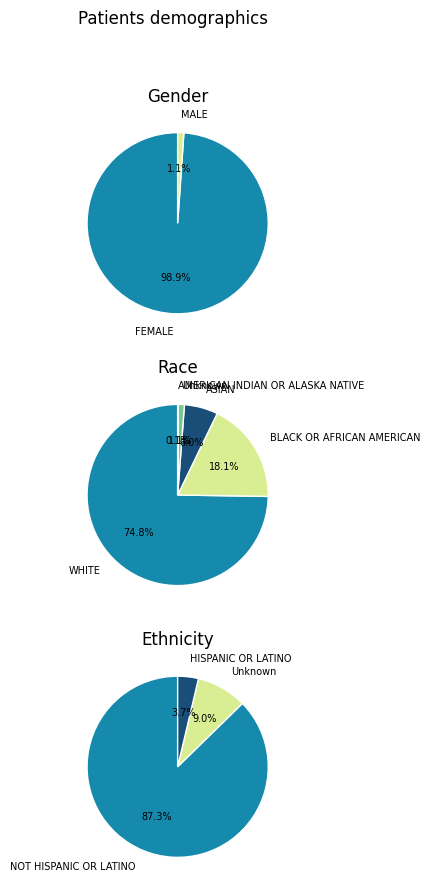

In [ ]:
demographic=[g_count,r_count,eth_count]
demo_tit=['Gender','Race','Ethnicity']
colors=['#168aad','#d9ed92','#184e77','#76c893']
#  Categorical Data
a = 3  # number of rows
b = 1  # number of columns
c = 1  # initialize plot counter

fig,axs=plt.subplots(3, 1, figsize=(4, 10))
plt.suptitle('Patients demographics', fontsize = 12)

for i, t, ax in zip(demographic, demo_tit, axs.ravel()):
    plt.subplot(a, b, c)
    plt.title(t)
    plt.pie(x=i,labels=i.index, autopct='%1.1f%%',startangle=90, wedgeprops={'linewidth': 1.0,'edgecolor':'white'},
            textprops={'fontsize': 7},colors=colors, labeldistance=1.2)
    c = c + 1

#plt.tight_layout()
plt.show()


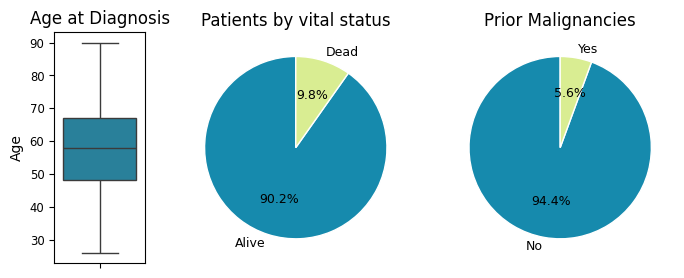

In [ ]:
sns.set_palette(['#168aad','#d9ed92'])

fig,axs=plt.subplots(1,3,figsize=(8,3),gridspec_kw=dict(width_ratios=[2,5,5]))

sns.boxplot(data=df,y='age_at_diagnosis',ax=axs[0])
axs[0].set(ylabel='Age',xlabel=None,title='Age at Diagnosis')
axs[0].tick_params(labelsize='small')

axs[1].pie(x=vital, labels=vital.index,autopct='%1.1f%%',wedgeprops={'linewidth': 1.0,'edgecolor':'white'},textprops={'fontsize': 9},startangle=90)
axs[1].set(title='Patients by vital status')

axs[2].pie(x=mal, labels=mal.index,autopct='%1.1f%%',wedgeprops={'linewidth': 1.0,'edgecolor':'white'},textprops={'fontsize': 9},startangle=90)
axs[2].set(title='Prior Malignancies')

plt.show()

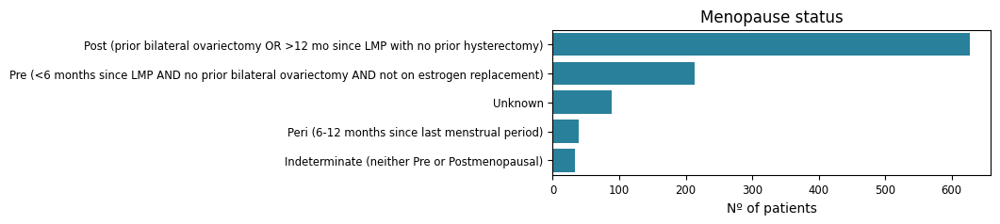

In [ ]:
sns.set_palette(['#168aad'])

fig, ax = plt.subplots(figsize=(6,2))
sns.countplot(y=df['menopause_status'],order=df['menopause_status'].value_counts(ascending=False).index)
plt.title('Menopause status')
ax.tick_params(labelsize='small')
ax.set_ylabel(None)
ax.set_xlabel('Nº of patients')
plt.show()

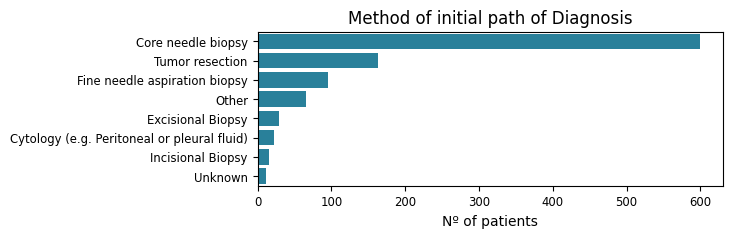

In [ ]:
sns.set_palette(['#168aad'])

fig, ax = plt.subplots(figsize=(6,2))
sns.countplot(y=df['method_initial_path_dx'],order=df['method_initial_path_dx'].value_counts(ascending=False).index)
plt.title('Method of initial path of Diagnosis')
ax.tick_params(labelsize='small')
ax.set_ylabel(None)
ax.set_xlabel('Nº of patients')
plt.show()

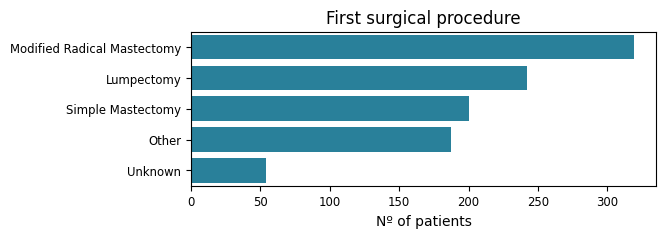

In [ ]:
sns.set_palette(['#168aad'])

fig, ax = plt.subplots(figsize=(6,2))
sns.countplot(y=df['surgical_procedure_first'],order=df['surgical_procedure_first'].value_counts(ascending=False).index)
plt.title('First surgical procedure')
ax.tick_params(labelsize='small')
ax.set_ylabel(None)
ax.set_xlabel('Nº of patients')
plt.show()

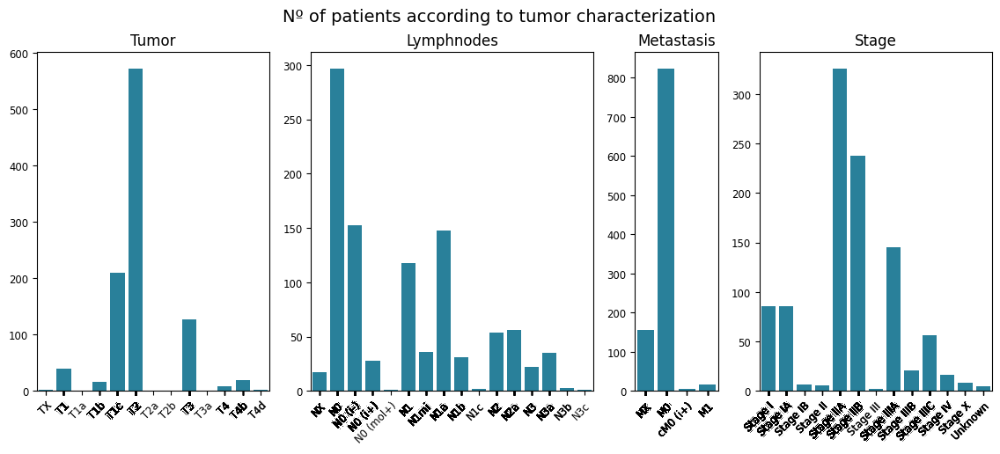

In [ ]:
tumor_order=['TX','T1','T1a','T1b','T1c','T2','T2a','T2b','T3','T3a','T4','T4b','T4d']
node_order=['NX','N0','N0 (i-)','N0 (i+)','N0 (mol+)','N1','N1mi','N1a','N1b','N1c','N2','N2a','N3','N3a','N3b','N3c']
metastasis_order=['MX','M0','cM0 (i+)','M1']
stage_order=['Stage I','Stage IA','Stage IB','Stage II','Stage IIA','Stage IIB','Stage III',
             'Stage IIIA','Stage IIIB','Stage IIIC','Stage IV','Stage X','Unknown']
order=[tumor_order,node_order,metastasis_order,stage_order]

ajcc=['ajcc_tumor_pathologic_pt','ajcc_nodes_pathologic_pn','ajcc_metastasis_pathologic_pm','ajcc_pathologic_tumor_stage']
ajcc_tit=['Tumor','Lymphnodes','Metastasis','Stage']

#  Categorical Data
a = 1  # number of rows
b = 4  # number of columns
c = 1  # initialize plot counter

fig,axs=plt.subplots(1,4, figsize=(14, 5),gridspec_kw=dict(width_ratios=[7,8.5,2.5,7]))
plt.suptitle('Nº of patients according to tumor characterization', fontsize = 14)

for i, t, ax, o in zip(ajcc, ajcc_tit, axs.ravel(),order):
    plt.subplot(a, b, c)
    plt.title(t,fontsize=12)
    sns.countplot(x = df[i],order=o)
    ax.tick_params(labelsize='small')
    ax.set_xticks(df[i])
    ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    c = c + 1


#plt.tight_layout()
plt.show()

#order=df[i].value_counts().index
#    ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')
#    ax.set_xticks(df[i])


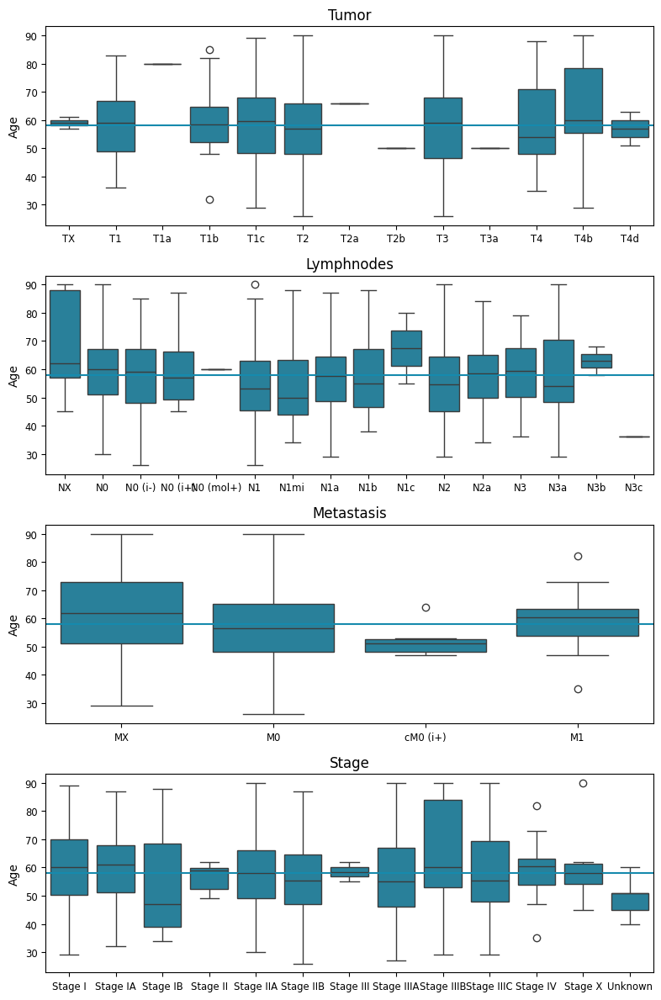

In [ ]:
#  Categorical Data
a = 4  # number of rows
b = 1  # number of columns
c = 1  # initialize plot counter

fig,axs=plt.subplots(4,1, figsize=(8, 12))

for i, t, ax, o in zip(ajcc, ajcc_tit, axs.ravel(),order):
    plt.subplot(a, b, c)
    plt.title(t)
    ax.tick_params(labelsize='small')
    sns.boxplot(data = df, x = i, y = 'age_at_diagnosis',order=o)
    ax.axhline(y=58)
    ax.set_xlabel(None)
    ax.set_ylabel('Age')
    c = c + 1

plt.tight_layout()
plt.show()

<ipython-input-52-3c980bf44e82>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')
<ipython-input-52-3c980bf44e82>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')
<ipython-input-52-3c980bf44e82>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')


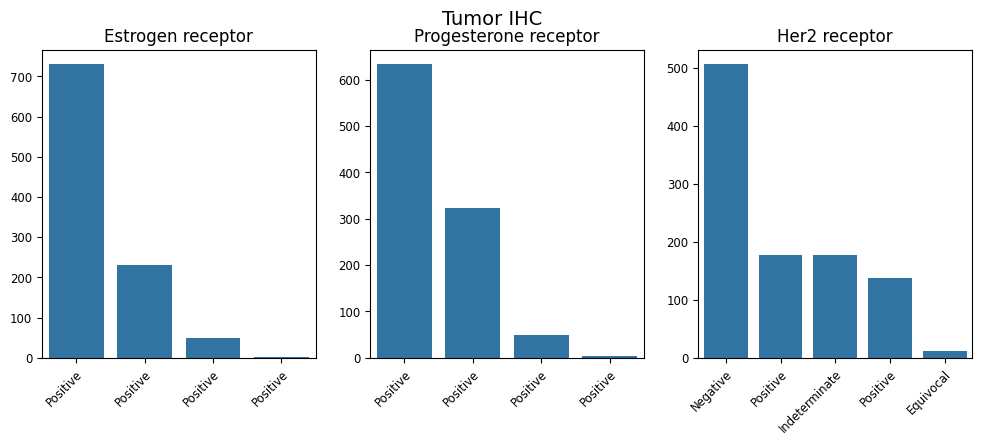

In [ ]:
ihc=['er_status_by_ihc','pr_status_by_ihc','her2_status_by_ihc']
ihc_t=['Estrogen receptor', 'Progesterone receptor', 'Her2 receptor']

#  Categorical Data
a = 1  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig,axs=plt.subplots(1,3, figsize=(12, 4))
plt.suptitle('Tumor IHC', fontsize = 14)

for i, t, ax in zip(ihc, ihc_t, axs.ravel()):
    plt.subplot(a, b, c)
    plt.title(t,fontsize=12)
    ax.tick_params(labelsize='small')
    ax.set_xticklabels(df[i], rotation=45, ha='right', rotation_mode='anchor')
    sns.countplot(x = df[i],order=df[i].value_counts(ascending=False).index)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    c = c + 1


#plt.tight_layout()
plt.show()

# Feature engineering

I create a feature of % of LN positivity for H/E staining

In [ ]:
df['LNposit']=df['lymph_nodes_examined_he_count']/df['lymph_nodes_examined_count']

In [ ]:
df['LNposit'].describe()

count    1001.000000
mean             inf
std              NaN
min         0.000000
25%         0.000000
50%         0.058824
75%         0.222222
max              inf
Name: LNposit, dtype: float64

There are values that result in infinity by mistake: ?Hay valores que dan ratio


infinito por error: positivdad con 0 LN examinados, lo modifico:

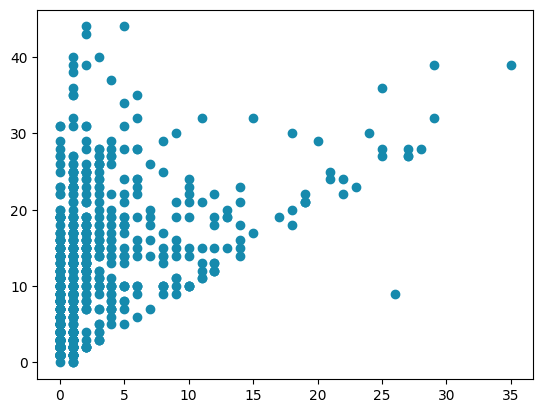

In [ ]:
plt.scatter(df['lymph_nodes_examined_he_count'],df['lymph_nodes_examined_count'])

In [ ]:
df.loc[df.lymph_nodes_examined_count == 0,'lymph_nodes_examined_he_count'] = 0

In [ ]:
df['LNposit']=df['lymph_nodes_examined_he_count']/df['lymph_nodes_examined_count']

In [ ]:
df['LNposit'].describe()

count    1007.000000
mean        0.178536
std         0.284545
min         0.000000
25%         0.000000
50%         0.058824
75%         0.214286
max         2.888889
Name: LNposit, dtype: float64

In [ ]:
df['LNposit']=df['LNposit'].fillna(value=0)

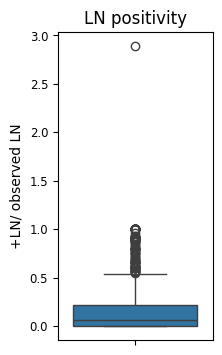

In [ ]:
fig, ax = plt.subplots(figsize=(2,4))
sns.boxplot(data=df,y='LNposit')
plt.title('LN positivity')
ax.tick_params(labelsize='small')
ax.set_ylabel('+LN/ observed LN')
ax.set_xlabel(None)
plt.show()

# Feature Selection

Hago un subset del df y encodeo 4 variables. Antes, simplifico la clasificación de los estadíos

In [ ]:
df2=df[['age_at_diagnosis','menopause_status','LNposit','er_status_by_ihc','pr_status_by_ihc','her2_status_by_ihc','ajcc_pathologic_tumor_stage']]

Voy a simplificar la clasificación de estadío para agrandar los grupos:

* Stage I: stage I, IA y IB

* Stage II: stage II, IIA, IIB

* Stage III: stage III y IIIA

* Stage III-IV: stage IIIB, IIIC y IV

Elimino unknown y discrepancias (inclueyndo X)


In [ ]:
df2=df2.replace({'ajcc_pathologic_tumor_stage':{'Stage IA':'Stage I','Stage IB':'Stage I',
                                                'Stage IIA':'Stage II','Stage IIB':'Stage II',
                                                'Stage IIIA':'Stage III',
                                                'Stage IIIB':'Stage III-IV','Stage IIIC':'Stage III-IV','Stage IV':'Stage III-IV'}})

In [ ]:
df2=df2.drop(df2[df2.ajcc_pathologic_tumor_stage=='Unknown'].index)
df2=df2.drop(df2[df2.ajcc_pathologic_tumor_stage=='[Discrepancy]'].index)
df2=df2.drop(df2[df2.ajcc_pathologic_tumor_stage=='Stage X'].index)

In [ ]:
df2_x=df2[['age_at_diagnosis','menopause_status','LNposit','er_status_by_ihc','pr_status_by_ihc','her2_status_by_ihc']]
df2_y=df2['ajcc_pathologic_tumor_stage']

In [ ]:
df2x_new=pd.get_dummies(df2_x,columns=['menopause_status','er_status_by_ihc','pr_status_by_ihc','her2_status_by_ihc'])

In [ ]:
df2x_new.head()

,age_at_diagnosis,LNposit,menopause_status_Indeterminate (neither Pre or Postmenopausal),menopause_status_Peri (6-12 months since last menstrual period),menopause_status_Post (prior bilateral ovariectomy OR >12 mo since LMP with no prior hysterectomy),menopause_status_Pre (<6 months since LMP AND no prior bilateral ovariectomy AND not on estrogen replacement),menopause_status_Unknown,er_status_by_ihc_Indeterminate,er_status_by_ihc_Negative,er_status_by_ihc_Positive,er_status_by_ihc_[Not Evaluated],pr_status_by_ihc_Indeterminate,pr_status_by_ihc_Negative,pr_status_by_ihc_Positive,pr_status_by_ihc_[Not Evaluated],her2_status_by_ihc_Equivocal,her2_status_by_ihc_Indeterminate,her2_status_by_ihc_Negative,her2_status_by_ihc_Positive,her2_status_by_ihc_[Not Evaluated]
3,50,0.066667,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,True,False
4,62,0.043478,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False
5,52,0.000000,False,False,False,False,True,False,False,True,False,False,False,True,False,False,False,False,True,False
6,50,0.285714,False,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False
7,42,0.000000,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,True,False,False


# Modelos

## Random Forest


**OBJETIVO:** predecir estadío del cáncer según datos de edad, menopausia y marcación por HE de los linfonodos o inmunohistoquímica de las células del tumor.

Uso Random Forest, con un 80% para train y 20% para test. Para evaluarlo, miro principalmente el recall, para minimizar los falsos negativos.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df2x_new, df2_y, test_size=0.2, random_state=29)

In [ ]:
clf = RandomForestClassifier(max_depth=5, random_state=22)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=22)

In [ ]:
# Obtener predicciones
y_pred= clf.predict(X_test)

In [ ]:
print(classification_report(y_pred=y_pred, y_true= y_test))

              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        31
    Stage II       0.56      0.98      0.71       110
   Stage III       0.00      0.00      0.00        28
Stage III-IV       0.50      0.07      0.12        30

    accuracy                           0.55       199
   macro avg       0.26      0.26      0.21       199
weighted avg       0.38      0.55      0.41       199



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**OBS:** predice mejor el estadío II.

Pruebo otros valores del hiperparámetro max_depth, pero no cambia prácticamente.

In [ ]:
clf = RandomForestClassifier(max_depth=15, random_state=29)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, random_state=29)

In [ ]:
# Obtener predicciones
y_pred2= clf.predict(X_test)

In [ ]:
print(classification_report(y_pred=y_pred2, y_true= y_test))

              precision    recall  f1-score   support

     Stage I       0.37      0.32      0.34        31
    Stage II       0.65      0.75      0.69       110
   Stage III       0.28      0.25      0.26        28
Stage III-IV       0.62      0.43      0.51        30

    accuracy                           0.56       199
   macro avg       0.48      0.44      0.45       199
weighted avg       0.55      0.56      0.55       199



## KNN

**OBJETIVO:** predecir estadío del cáncer según datos de edad, menopausia y marcación por HE de los linfonodos o inmunohistoquímica de las células del tumor.

Uso KNN, con un 80% para train y 20% para test. Para evaluarlo, miro principalmente el recall, para minimizar los falsos negativos.

In [ ]:
#uso el df2

X_train3, X_test3, y_train3, y_test3 = train_test_split(df2x_new,df2_y,test_size=0.2, random_state=29)

# Scale the features using StandardScaler
#The fit_transform method is used to fit the scaler to the training data and transform it,
#while the transform method is used to transform the test data using the same scaling parameters

scaler = StandardScaler()
X_train3 = scaler.fit_transform(X_train3)
X_test3 = scaler.transform(X_test3)


In [ ]:
n_neighbors = 3

knn = neighbors.KNeighborsClassifier(n_neighbors)
knn.fit(X_train3, y_train3)

preds3 = knn.predict(X_test3)
print(metrics.classification_report(y_test3, preds3))

              precision    recall  f1-score   support

     Stage I       0.24      0.29      0.26        31
    Stage II       0.57      0.63      0.60       110
   Stage III       0.15      0.14      0.15        28
Stage III-IV       0.71      0.33      0.45        30

    accuracy                           0.46       199
   macro avg       0.42      0.35      0.37       199
weighted avg       0.48      0.46      0.46       199



In [ ]:
n_neighbors = 5

knn = neighbors.KNeighborsClassifier(n_neighbors)
knn.fit(X_train3, y_train3)

preds3 = knn.predict(X_test3)
print(metrics.classification_report(y_test3, preds3))

              precision    recall  f1-score   support

     Stage I       0.21      0.23      0.22        31
    Stage II       0.57      0.74      0.65       110
   Stage III       0.12      0.07      0.09        28
Stage III-IV       0.75      0.20      0.32        30

    accuracy                           0.48       199
   macro avg       0.41      0.31      0.32       199
weighted avg       0.48      0.48      0.45       199



In [ ]:
n_neighbors = 10

knn = neighbors.KNeighborsClassifier(n_neighbors)
knn.fit(X_train3, y_train3)

preds3 = knn.predict(X_test3)
print(metrics.classification_report(y_test3, preds3))

              precision    recall  f1-score   support

     Stage I       0.37      0.35      0.36        31
    Stage II       0.59      0.80      0.68       110
   Stage III       0.29      0.14      0.19        28
Stage III-IV       0.86      0.20      0.32        30

    accuracy                           0.55       199
   macro avg       0.53      0.37      0.39       199
weighted avg       0.56      0.55      0.51       199



In [ ]:
n_neighbors = 15

knn = neighbors.KNeighborsClassifier(n_neighbors)
knn.fit(X_train3, y_train3)

preds3 = knn.predict(X_test3)
print(metrics.classification_report(y_test3, preds3))

              precision    recall  f1-score   support

     Stage I       0.31      0.13      0.18        31
    Stage II       0.56      0.88      0.69       110
   Stage III       0.25      0.11      0.15        28
Stage III-IV       0.50      0.03      0.06        30

    accuracy                           0.53       199
   macro avg       0.41      0.29      0.27       199
weighted avg       0.47      0.53      0.44       199



Al igual que en random forest, los mejores resultados de recall son para el **estadío 2**.

El accuracy de Random Forest es ligeramente mejor que en KNN.

## Hypertunning

Intento mejorar el RandomForest eligiendo los hiperparámetros con el Halving Randomized Search

In [ ]:
params_grid = {'n_estimators': [25, 50, 100, 150],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [5, 10, 15],
    'max_leaf_nodes': [3, 6, 9]}

In [ ]:
halving_cv = HalvingRandomSearchCV(clf, params_grid, scoring="accuracy", factor=3)
halving_cv.fit(X_train, y_train)

print("Mejores parametros", halving_cv.best_params_)
print("Mejor Score CV", halving_cv.best_score_)
print('Accuracy del modelo = {round(accuracy_score(y_test, halving_cv.predict(X_test)), 5)}')

Mejores parametros {'n_estimators': 50, 'max_leaf_nodes': 3, 'max_features': None, 'max_depth': 15}
Mejor Score CV 0.6351721439749609
Accuracy del modelo = {round(accuracy_score(y_test, halving_cv.predict(X_test)), 5)}


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df2x_new, df2_y, test_size=0.2, random_state=29)
clf = RandomForestClassifier(n_estimators=100, max_leaf_nodes=3, max_features=None, max_depth= 10, random_state=22)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, max_features=None, max_leaf_nodes=3,
                       random_state=22)

In [ ]:
# Obtener predicciones
y_predHRCV= clf.predict(X_test)

In [ ]:
print(classification_report(y_pred=y_predHRCV, y_true= y_test))

              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        31
    Stage II       0.62      0.96      0.76       110
   Stage III       0.00      0.00      0.00        28
Stage III-IV       0.68      0.63      0.66        30

    accuracy                           0.63       199
   macro avg       0.33      0.40      0.35       199
weighted avg       0.45      0.63      0.52       199



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## K fold cross validation

In [ ]:
skf = StratifiedKFold(n_splits=5, random_state=35, shuffle=True)
skf.get_n_splits(df2x_new, df2_y)

5

In [ ]:
# Seteo los hiperparámetros obtenidos en el punto anterior
model = RandomForestClassifier(n_estimators=100, max_leaf_nodes=3, max_features=None, max_depth= 10, random_state=29)
# Lista para guardar accuracy
list_ac=[]

for i, (train_index, test_index) in enumerate(skf.split(df2x_new, df2_y)):
    # Separar train y test
    X_train_n, X_test_n = df2x_new.iloc[train_index], df2x_new.iloc[test_index]
    y_train_n, y_test_n = df2_y.iloc[train_index], df2_y.iloc[test_index]
    # Ajustar el modelo
    model.fit(X_train_n, y_train_n)
    # Predicciones
    pred = model.predict(X_test_n)
    # Calculo del error
    accuracy = accuracy_score(y_true=y_test_n, y_pred=pred)
    print('Accuracy Iteration', i + 1, ':', accuracy)
    list_ac.append(accuracy)
    print(classification_report(y_pred=pred, y_true= y_test_n))

# Promedio de accuracy
print('AVG Accuracy:', np.mean(list_ac))

Accuracy Iteration 1 : 0.6381909547738693
              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        36
    Stage II       0.64      0.98      0.78       115
   Stage III       0.33      0.03      0.06        29
Stage III-IV       0.65      0.68      0.67        19

    accuracy                           0.64       199
   macro avg       0.41      0.43      0.38       199
weighted avg       0.48      0.64      0.52       199



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy Iteration 2 : 0.6080402010050251
              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        35
    Stage II       0.63      0.95      0.75       115
   Stage III       0.00      0.00      0.00        30
Stage III-IV       0.48      0.63      0.55        19

    accuracy                           0.61       199
   macro avg       0.28      0.39      0.32       199
weighted avg       0.41      0.61      0.49       199



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy Iteration 3 : 0.6180904522613065
              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        36
    Stage II       0.63      0.98      0.76       114
   Stage III       0.00      0.00      0.00        30
Stage III-IV       0.55      0.58      0.56        19

    accuracy                           0.62       199
   macro avg       0.29      0.39      0.33       199
weighted avg       0.41      0.62      0.49       199



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy Iteration 4 : 0.6060606060606061
              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        36
    Stage II       0.62      0.98      0.76       114
   Stage III       0.00      0.00      0.00        30
Stage III-IV       0.50      0.44      0.47        18

    accuracy                           0.61       198
   macro avg       0.28      0.36      0.31       198
weighted avg       0.40      0.61      0.48       198



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy Iteration 5 : 0.6111111111111112
              precision    recall  f1-score   support

     Stage I       0.00      0.00      0.00        36
    Stage II       0.63      0.94      0.76       114
   Stage III       0.00      0.00      0.00        29
Stage III-IV       0.48      0.74      0.58        19

    accuracy                           0.61       198
   macro avg       0.28      0.42      0.33       198
weighted avg       0.41      0.61      0.49       198

AVG Accuracy: 0.6162986650423836


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


No subió el accuracy al implementar la cros-validación